# Libraries importing and accesing data


In [ ]:
#installing libraries 
#!pip uninstall scikit-learn
#!pip install scikit-learn==0.23.2
#!pip install scikit-multilearn

#installing auto-ml libraries 
!pip install pycaret 

#to get interactive plots in google colab
from pycaret.utils import enable_colab
enable_colab()

##libraries 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

#from pycaret.nlp import *
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import StratifiedKFold, cross_validate, train_test_split, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix, precision_score, recall_score,  accuracy_score, precision_recall_curve
from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.model_selection import train_test_split
from sklearn.feature_extraction.text import TfidfVectorizer
#from skmultilearn.adapt import MLkNN
from sklearn.metrics import hamming_loss, accuracy_score

     |████████████████████████████████| 266kB 2.9MB/s 
     |████████████████████████████████| 81kB 6.5MB/s 
     |████████████████████████████████| 14.4MB 203kB/s 
     |████████████████████████████████| 276kB 34.4MB/s 
     |████████████████████████████████| 61kB 7.3MB/s 
     |████████████████████████████████| 2.0MB 34.9MB/s 
     |████████████████████████████████| 1.4MB 19.6MB/s 
     |████████████████████████████████| 256kB 40.4MB/s 
     |████████████████████████████████| 112kB 44.0MB/s 
     |████████████████████████████████| 6.8MB 35.3MB/s 
     |████████████████████████████████| 1.7MB 31.2MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 174kB 40.6MB/s 
     |████████████████████████████████| 1.1MB 30.1MB/s 
     |████████████████████████████████| 1.1MB 32.2MB/s 
     |████████████████████████████████| 174kB 41.6MB

In [ ]:
import os
import glob
import re

In [ ]:
#Mounting drive to google colab to speed up the process to input the high volume data files
#Note : I have added the zip folder in my google drive an extracted the files in google colab itself
from google.colab import drive
drive.mount('/content/gdrive')
!unzip gdrive/My\ Drive/ZS\ DSA/4a4a221c-e-dataset.zip

Streaming output truncated to the last 5000 lines.
  inflating: dataset/train/product_info/PROJ0x843b.txt  
  inflating: dataset/train/product_info/PROJ0x843c.txt  
  inflating: dataset/train/product_info/PROJ0x843d.txt  
  inflating: dataset/train/product_info/PROJ0x843e.txt  
  inflating: dataset/train/product_info/PROJ0x843f.txt  
  inflating: dataset/train/product_info/PROJ0x844.txt  
  inflating: dataset/train/product_info/PROJ0x8440.txt  
  inflating: dataset/train/product_info/PROJ0x8442.txt  
  inflating: dataset/train/product_info/PROJ0x8443.txt  
  inflating: dataset/train/product_info/PROJ0x8444.txt  
  inflating: dataset/train/product_info/PROJ0x8447.txt  
  inflating: dataset/train/product_info/PROJ0x844c.txt  
  inflating: dataset/train/product_info/PROJ0x844e.txt  
  inflating: dataset/train/product_info/PROJ0x844f.txt  
  inflating: dataset/train/product_info/PROJ0x845.txt  
  inflating: dataset/train/product_info/PROJ0x8452.txt  
  inflating: dataset/train/product_info

In [ ]:
#importing train and test CSV files
automobile_industry = pd.read_csv('dataset/train/automobile_industry.csv')
computer_industry = pd.read_csv('dataset/train/computer_industry.csv')
health_industry = pd.read_csv('dataset/train/health_industry.csv')
manufacturing_industry = pd.read_csv('dataset/train/manufacturing_industry.csv')
power_industry = pd.read_csv('dataset/train/power_industry.csv')
test = pd.read_csv('dataset/test/test.csv')

In [ ]:
##Making a copy of all the train files to preseve the original datasets 
automobile = automobile_industry.copy(deep = True)
computer = computer_industry.copy(deep = True)
health = health_industry.copy(deep = True)
manufacturing= manufacturing_industry.copy(deep = True)
power = power_industry.copy(deep = True)
##Adding a souce column to track the industry of each dataset
automobile['source_data'] = 'Automobile Industry'
computer['source_data'] = 'Computer Industry'
health['source_data'] = 'Health Industry'
manufacturing['source_data']= 'Manufacturing Industry'
power['source_data'] = 'Power Industry'

In [ ]:
##Appending all the different industry dataset into 1 dataframe to perform EDA and feature analysis 
all_industry = automobile.append([computer,health,manufacturing,power])
all_industry.head()



,ID,Symbol,Start_date,market_cap,Sector,Country,CEO,No.of employee,Revenue (Cr),Net-valuation (Cr),Share_price (RS),Company_background,Type,Product,source_data
0,PROJ0x5377,NaN,NaN,?,Private_sector,Guatemala,Pamela Terrano,NaN,15.226766068690289,2284.014910,325.200000,The LCV concept was created as a compact truc...,Light Vehicles,Bike,Automobile Industry
1,PROJ0x24dc,NaN,NaN,small-cap,Private_sector,NaN,?,NaN,-999.0,-11230.811693,75.350000,Data movement is typically from one place in m...,Light Vehicles,AI,Automobile Industry
2,PROJ0x78e,NaN,NaN,large-cap,Public_sector,NaN,?,NaN,24.27911260914369,7283.733783,653.650000,1% share in Daimler AG.Dongfeng Motor and Niss...,Heavy Vehicles,JCP,Automobile Industry
3,PROJ0x403b,NaN,NaN,small-cap,Private_sector,NaN,?,17373.0,1.4027782279531942,35.069456,-22.246569,"Software patents, like other types of patents,...",Light Vehicles,AI,Automobile Industry
4,PROJ0x8700,NaN,NaN,mid-cap,?,Madagascar,Elizabeth Finch,NaN,3.5152032346897326,703.040647,61.400000,Data transmission has three aspects: transmiss...,Light Vehicles,AI,Automobile Industry


## **BASIC EDA**

In [ ]:
all_industry.describe()

,No.of employee,Net-valuation (Cr),Share_price (RS)
count,9564.000000,15896.000000,19469.000000
mean,24893.030217,1998.416353,402.239558
std,21818.740348,13769.866535,3043.306601
min,1.000000,-91524.892623,-23276.406748
25%,6928.750000,188.801514,54.450000
50%,18509.000000,1101.247801,332.550000
75%,38382.000000,4404.665252,890.500000
max,97590.000000,83237.474347,20480.908699


In [ ]:
#checking for unique values?
all_industry.apply(lambda x: len(x.unique()))

ID                    23909
Symbol                 5948
Start_date              781
market_cap                5
Sector                    4
Country                 232
CEO                    8571
No.of employee         8746
Revenue (Cr)          14473
Net-valuation (Cr)    15897
Share_price (RS)      15567
Company_background    23326
Type                     15
Product                  25
source_data               5
dtype: int64

In [ ]:
all_industry.dtypes

ID                     object
Symbol                 object
Start_date             object
market_cap             object
Sector                 object
Country                object
CEO                    object
No.of employee        float64
Revenue (Cr)           object
Net-valuation (Cr)    float64
Share_price (RS)      float64
Company_background     object
Type                   object
Product                object
source_data            object
dtype: object

*ID is the unique identifier*
We have 5 different **industries**, 15 different **Types**, and 25 different **Products**

At first glance, we see "Revenue (Cr)" is entered as object 
Start_date is also entered as object.

These doesn't look great, I don't think any of these variables except **Company Background** might be super useful in predicting the Type of the product 


Checking the frequency of values of categorical columns 

In [ ]:
##Filtereing categorical data
categorical_columns = [x for x in all_industry.dtypes.index if all_industry.dtypes[x] == 'object']
#Exclude columns which are not categorical or not very useful to see 
categorical_columns = [x for x in categorical_columns if x not in ['ID','Start_date','source','Company_background','Revenue (Cr)']]
for col in categorical_columns:
    print ('\nFrequency of Categories for variable %s'%col)
    print (all_industry[col].value_counts())


Frequency of Categories for variable Symbol
JDG     4
KOW     4
VXV     3
AWY     3
VOL     3
       ..
RTZY    1
QBJ     1
GWWH    1
LXC     1
UCV     1
Name: Symbol, Length: 5947, dtype: int64

Frequency of Categories for variable market_cap
?            12055
large-cap     5155
small-cap     4795
mid-cap       1867
Name: market_cap, dtype: int64

Frequency of Categories for variable Sector
?                 9341
Public_sector     5837
Private_sector    5805
Name: Sector, dtype: int64

Frequency of Categories for variable Country
Dominican Republic    32
French Guiana         27
Norfolk Island        26
Sudan                 26
Guatemala             26
                      ..
Slovenia               8
Fiji                   8
China                  8
Turkmenistan           8
Brunei Darussalam      7
Name: Country, Length: 231, dtype: int64

Frequency of Categories for variable CEO
?                   15213
Robert Johnson          4
James Smith             3
Jason Jones             3

In [ ]:
# Heavy Vehicles and Heavy Vehicles seems to be in one category 
all_industry['Type'] = all_industry['Type'].replace({'Heavy vehicle':'Heavy Vehicles'})
#all_industry['Type'].value_counts

We see a lot of "?" values, we can change them to NaNs for python to understand they are not actual categories 

In [ ]:
all_industry.replace({'market_cap': {'?': np.nan}}, regex=False,inplace=True)
all_industry.replace({'Sector': {'?': np.nan}}, regex=False,inplace=True)
all_industry.replace({'CEO': {'?': np.nan}}, regex=False,inplace=True)
all_industry.replace({'Symbol': {'nan': np.nan}}, regex=False,inplace=True)
all_industry.replace({'Start_date': {'nan': np.nan}}, regex=False,inplace=True)
all_industry.replace({'Country': {'nan': np.nan}}, regex=False,inplace=True)
#all_industry.replace({'No.of employee': {'nan': np.nan}}, regex=False,inplace=True)

In [ ]:
#all_industry.head()

In [ ]:
#all_industry.tail()

**There** is a lot of null values, counting the nulls for each column

In [ ]:
##Getting percentages 
percent_missing = all_industry.isnull().sum() * 100 / len(all_industry)
values_missing = all_industry.isnull().sum()
missing_value_df = pd.DataFrame({'column_name': all_industry.columns,
                                 'percent_missing': percent_missing,
                                 'values_missing': values_missing}
                                )
missing_value_df.sort_values('percent_missing', inplace=True, ascending= False)
print(missing_value_df)

                           column_name  percent_missing  values_missing
Country                        Country        84.901083           20299
Symbol                          Symbol        72.625371           17364
CEO                                CEO        63.741687           15240
Start_date                  Start_date        63.147769           15098
No.of employee          No.of employee        59.998327           14345
Sector                          Sector        51.307039           12267
market_cap                  market_cap        50.575097           12092
Net-valuation (Cr)  Net-valuation (Cr)        33.514576            8013
Share_price (RS)      Share_price (RS)        18.570413            4440
Company_background  Company_background         0.351332              84
Type                              Type         0.313689              75
Revenue (Cr)              Revenue (Cr)         0.192396              46
ID                                  ID         0.000000         

Symbol, Start_date , market_cap, Sector, Country, CEO , No.of employee, Net-valuation (Cr) , Share_price (RS) have a lot of null values - Hence we might remove them  

In [ ]:
#Glob module is used to retrieve files/pathnames matching a specified pattern
#We also realise that one of the file has some special characters and does not open with encoding="utf-8". 
#Hence using Latin encoding to retrive the file
file_path = 'dataset/train/product_info/'
txt_files = glob.glob(os.path.join(file_path, "*.txt"))

column_names = ["Product_ID", "Product_Info"]

product_descriptions = pd.DataFrame(columns = column_names)

# loop over the list of csv files
for train_files in txt_files:
    regex = r"([a-zA-Z0-9]+).txt"
    matches = re.findall(regex, train_files, re.MULTILINE)

    if train_files == 'dataset/train/product_info/PROJ0x47bf.txt':
        with open(train_files, 'r', encoding="latin-1") as file:
            data = file.read().replace('\n', '')
            product_descriptions = product_descriptions.append({'Product_ID': [matches[0]], 'Product_Info': [data]}, ignore_index=True)
    else:
        with open(train_files, 'r', encoding="utf-8") as file:
            data = file.read().replace('\n', '')
            product_descriptions = product_descriptions.append({'Product_ID': matches[0], 'Product_Info': data}, ignore_index=True)
    

In [ ]:
#all_industry.head()



In [ ]:
#joining the text files in the product info tab on the basis of their file IDS (Each file corresponds to a snigle row)
#all_industry.reset_index(inplace = True)
#product_descriptions.reset_index(inplace = True)

all_industry_2 = all_industry.drop(['Symbol','Start_date','market_cap',	'Sector','Country',	'CEO',	'No.of employee',	'Revenue (Cr)',	'Net-valuation (Cr)',	'Share_price (RS)'	], axis =1 )

train_data = all_industry_2.astype(dtype= 'str').set_index('ID').join(product_descriptions.astype(dtype='str').set_index('Product_ID'))
#product_descriptions[product_descriptions.Product_ID == 'PROJ0x403b' ]

In [ ]:
train_data.head()

,Company_background,Type,Product,source_data,Product_Info
ID,,,,,
PROJ0x5377,The LCV concept was created as a compact truc...,Light Vehicles,Bike,Automobile Industry,5 million in 2019).36 mph (605.he just envisio...
PROJ0x24dc,Data movement is typically from one place in m...,Light Vehicles,AI,Automobile Industry,nan
PROJ0x78e,1% share in Daimler AG.Dongfeng Motor and Niss...,Heavy Vehicles,JCP,Automobile Industry,"They surged forward in the 2014 elections, rec..."
PROJ0x403b,"Software patents, like other types of patents,...",Light Vehicles,AI,Automobile Industry,Referring to statistical significance does not...
PROJ0x8700,Data transmission has three aspects: transmiss...,Light Vehicles,AI,Automobile Industry,Collaborative filtering by offering movies tha...


In [ ]:
train_data_processed_data = train_data.drop(['Type','Product','source_data' ], axis =1)

In [ ]:
train_data_processed_data.head()

,Company_background,Product_Info
ID,,
PROJ0x5377,The LCV concept was created as a compact truc...,5 million in 2019).36 mph (605.he just envisio...
PROJ0x24dc,Data movement is typically from one place in m...,nan
PROJ0x78e,1% share in Daimler AG.Dongfeng Motor and Niss...,"They surged forward in the 2014 elections, rec..."
PROJ0x403b,"Software patents, like other types of patents,...",Referring to statistical significance does not...
PROJ0x8700,Data transmission has three aspects: transmiss...,Collaborative filtering by offering movies tha...


In [ ]:
train_data_processed_data['All_text'] = train_data_processed_data["Company_background"].astype(str) + "_" + train_data_processed_data["Product_Info"].astype(str)

In [ ]:
train_data_processed_data.drop(['Company_background','Product_Info' ], axis =1, inplace= True)

In [ ]:
train_data_processed_data.reset_index()

,ID,All_text
0,PROJ0x5377,The LCV concept was created as a compact truc...
1,PROJ0x24dc,Data movement is typically from one place in m...
2,PROJ0x78e,1% share in Daimler AG.Dongfeng Motor and Niss...
3,PROJ0x403b,"Software patents, like other types of patents,..."
4,PROJ0x8700,Data transmission has three aspects: transmiss...
...,...,...
23904,PROJ0x7bb7,A switch to a circular economy would make ind...
23905,PROJ0x70a7,"2 billion.By the middle of the 20th century, e..."
23906,PROJ0x8488,Leadership in Energy and Environmental Design ...
23907,PROJ0x613e,More sustainable sources of biomass include cr...


## Feature Extraction and Engineering

In [ ]:
#Text processing libraries 
import re
import nltk
nltk.download('stopwords')
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
train_data['All_text'] = train_data["Company_background"].astype(str) + "_" + train_data["Product_Info"].astype(str)

**I have done the following text operations** 

-removed HTTP tags

-lowered the case

-removed all punctuation and Unicode

-removed stopwords

-lemmatization(converting a word into its root form considering the

 relevant Part of Speech associated with the word) 

In [ ]:
 train_data['All_text'] = train_data['All_text'].astype(str)
train_data['Company_background'] = train_data['Company_background'].astype(str)
train_data['Product_Info'] = train_data['Product_Info'].astype(str)
# Remove HTTP tags
train_data['All_text_processed'] = train_data['All_text'].map(lambda x : ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split()))
train_data['Company_background_processed'] = train_data['Company_background'].map(lambda x : ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split()))
train_data['Product_Info_processed'] = train_data['Product_Info'].map(lambda x : ' '.join(re.sub("(@[A-Za-z0-9]+)|([^0-9A-Za-z \t])|(\w+:\/\/\S+)"," ",x).split()))

#lower case
train_data['All_text_processed'] = train_data['All_text_processed'].map(lambda x: x.lower())
train_data['Company_background_processed'] = train_data['Company_background_processed'].map(lambda x: x.lower())
train_data['Product_Info_processed'] = train_data['Product_Info_processed'].map(lambda x: x.lower())

#Remove punctuations
train_data['All_text_processed'] = train_data['All_text_processed'].map(lambda x: re.sub(r'[^\w\s]', '', x))
train_data['Company_background_processed'] = train_data['Company_background_processed'].map(lambda x: re.sub(r'[^\w\s]', '', x))
train_data['Product_Info_processed'] = train_data['Product_Info_processed'].map(lambda x: re.sub(r'[^\w\s]', '', x))

#Remove unicodes
train_data['All_text_processed'] = train_data['All_text_processed'].map(lambda x : re.sub(r'[^\x00-\x7F]+',' ', x))
train_data['Company_background_processed'] = train_data['Company_background_processed'].map(lambda x : re.sub(r'[^\x00-\x7F]+',' ', x))
train_data['Product_Info_processed'] = train_data['Product_Info_processed'].map(lambda x : re.sub(r'[^\x00-\x7F]+',' ', x))




In [ ]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
nltk.download('stopwords')
# Remove stopwords
stop_words = stopwords.words('english')
train_data['All_text_processed'] = train_data['All_text_processed'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))
train_data['Company_background_processed'] = train_data['Company_background_processed'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))
train_data['Product_Info_processed'] = train_data['Product_Info_processed'].map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [ ]:
train_data.head()


,Company_background,Type,Product,source_data,Product_Info,All_text,All_text_processed,Company_background_processed,Product_Info_processed
ID,,,,,,,,,
PROJ0x5377,The LCV concept was created as a compact truc...,Light Vehicles,Bike,Automobile Industry,5 million in 2019).36 mph (605.he just envisio...,The LCV concept was created as a compact truc...,lcv concept created compact truck usually opti...,lcv concept created compact truck usually opti...,5 million 2019 36 mph 605 envisioned wanted on...
PROJ0x24dc,Data movement is typically from one place in m...,Light Vehicles,AI,Automobile Industry,nan,Data movement is typically from one place in m...,data movement typically one place memory anoth...,data movement typically one place memory anoth...,nan
PROJ0x78e,1% share in Daimler AG.Dongfeng Motor and Niss...,Heavy Vehicles,JCP,Automobile Industry,"They surged forward in the 2014 elections, rec...",1% share in Daimler AG.Dongfeng Motor and Niss...,1 share daimler ag dongfeng motor nissan 50 50...,1 share daimler ag dongfeng motor nissan 50 50...,surged forward 2014 elections receiving 7 040 ...
PROJ0x403b,"Software patents, like other types of patents,...",Light Vehicles,AI,Automobile Industry,Referring to statistical significance does not...,"Software patents, like other types of patents,...",software patents like types patents theoretica...,software patents like types patents theoretica...,referring statistical significance necessarily...
PROJ0x8700,Data transmission has three aspects: transmiss...,Light Vehicles,AI,Automobile Industry,Collaborative filtering by offering movies tha...,Data transmission has three aspects: transmiss...,data transmission three aspects transmission p...,data transmission three aspects transmission p...,collaborative filtering offering movies share ...


In [ ]:
# Lemmatize the text
nltk.download('wordnet')
lemmer = WordNetLemmatizer()
train_data['All_text_processed'] = train_data['All_text_processed'].map(lambda x : ' '.join([lemmer.lemmatize(w) for w in x.split() if w not in stop_words]))
train_data['Company_background_processed'] = train_data['Company_background_processed'].map(lambda x : ' '.join([lemmer.lemmatize(w) for w in x.split() if w not in stop_words]))
train_data['Product_Info_processed'] = train_data['Product_Info_processed'].map(lambda x : ' '.join([lemmer.lemmatize(w) for w in x.split() if w not in stop_words]))


[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [ ]:

#Removing Stop words again after Lemmatize
train_data['All_text_processed'] = train_data['All_text_processed'].map(lambda x : ' '.join([lemmer.lemmatize(w) for w in x.split() if w not in stop_words]))
train_data['Company_background_processed']  = train_data['Company_background_processed'] .map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))
train_data['Product_Info_processed']  = train_data['Product_Info_processed'] .map(lambda x : ' '.join([w for w in x.split() if w not in stop_words]))


In [ ]:
#Removing columns starting with numbers 

train_data['All_text_processed'] = train_data['All_text_processed'].map(lambda x : re.sub(r'[0-9]+','',x))
train_data['Company_background_processed']  = train_data['Company_background_processed'] .map(lambda x : re.sub(r'[0-9]+','',x))
train_data['Product_Info_processed']  = train_data['Product_Info_processed'] .map(lambda x : re.sub(r'[0-9]+','',x))


In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import HashingVectorizer

In [ ]:

#funtion to get 'top N' or 'bottom N' words
def get_n_words(corpus, direction, n):
    vec = CountVectorizer(stop_words = 'english').fit(corpus)
    bag_of_words = vec.transform(corpus)
    sum_words = bag_of_words.sum(axis=0) 
    words_freq = [(word, sum_words[0, idx]) for word, idx in vec.vocabulary_.items()]
    if direction == "top":
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=True)
    else:
        words_freq =sorted(words_freq, key = lambda x: x[1], reverse=False)
    return words_freq[:n]

In [ ]:
common_words_company = get_n_words(train_data['All_text_processed'], "top", 20)


In [ ]:
common_words_company

[('used', 10822),
 ('power', 8604),
 ('medicine', 7505),
 ('energy', 7417),
 ('use', 7297),
 ('computer', 7254),
 ('technology', 6484),
 ('term', 6148),
 ('data', 5978),
 ('company', 5668),
 ('information', 5482),
 ('world', 5412),
 ('device', 5295),
 ('software', 5265),
 ('state', 5221),
 ('medical', 5121),
 ('time', 5057),
 ('based', 4998),
 ('manufacturing', 4897),
 ('new', 4755)]

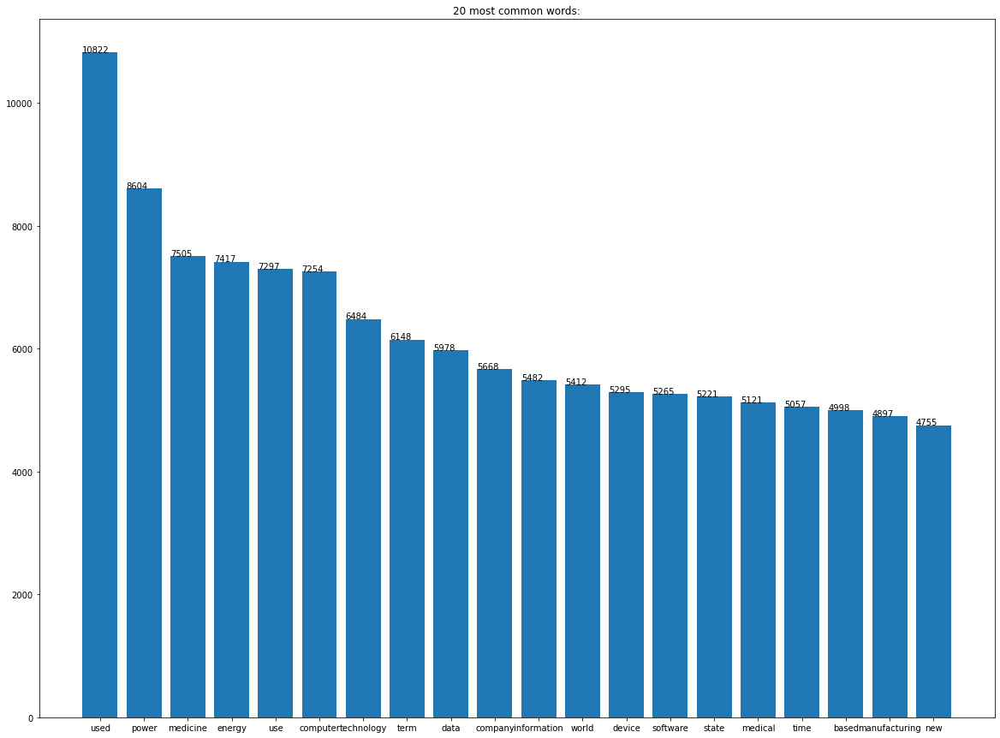

In [ ]:
common_words_company = dict(common_words_company)
names = list(common_words_company.keys())
values = list(common_words_company.values())
plt.subplots(figsize = (20,15))
bars = plt.bar(range(len(common_words_company)),values,tick_label=names, width = 0.8)
plt.title('20 most common words:')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .01, yval)
plt.show()

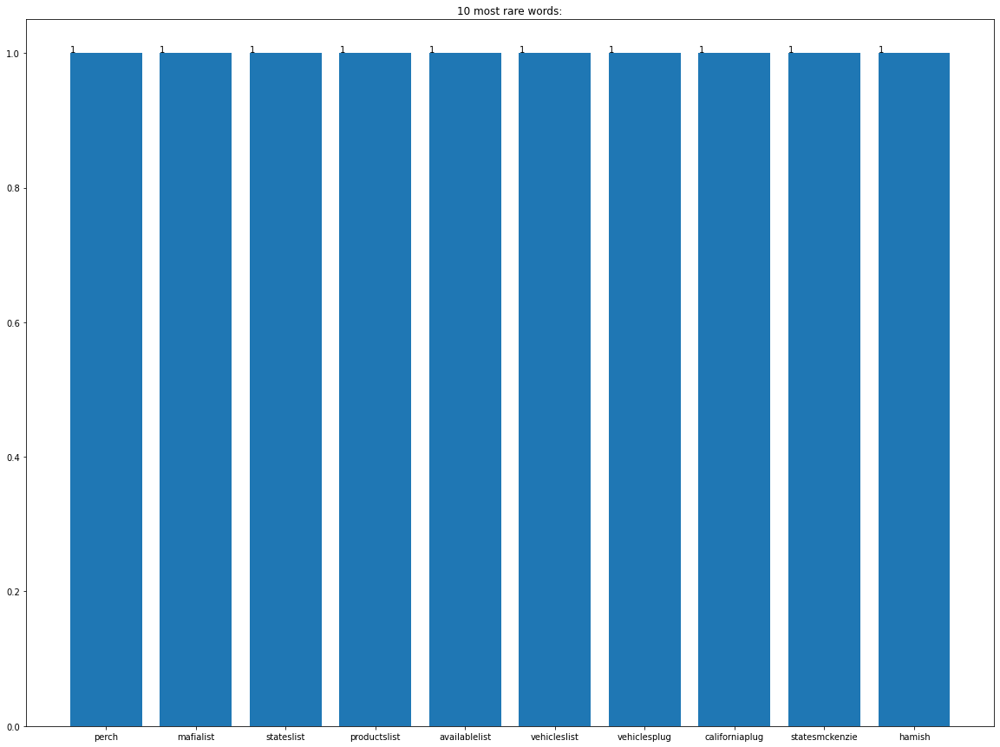

In [ ]:
rare_words_company = get_n_words(train_data['All_text_processed'], "bottom", 10)
rare_words_company = dict(rare_words_company)
names = list(rare_words_company.keys())
values = list(rare_words_company.values())
plt.subplots(figsize = (20,15))
bars = plt.bar(range(len(rare_words_company)),values,tick_label=names,width = 0.8)
plt.title('10 most rare words:')
for bar in bars:
    yval = bar.get_height()
    plt.text(bar.get_x(), yval + .001, yval)
plt.show()

In [ ]:
no_features = 400
tf_vectorizer_all = CountVectorizer(min_df=.015, max_df=.8, max_features=no_features, ngram_range=[1, 3])

tpl_tf_all = tf_vectorizer_all.fit_transform(train_data['All_text_processed'])
display("Bow-TF :", tpl_tf_all.shape)
df_tf_all= pd.DataFrame(tpl_tf_all.toarray(), columns=tf_vectorizer_all.get_feature_names())
display(df_tf_all.head())

'Bow-TF :'

(23909, 400)

,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,business,called,capacity,car,...,traditional,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:

no_features = 100
tf_vectorizer_1 = CountVectorizer(min_df=.015, max_df=.8, max_features=no_features, ngram_range=[1, 2])

tpl_tf_1 = tf_vectorizer_1.fit_transform(train_data['Company_background_processed'])
display("Bow-TF :", tpl_tf_1.shape)
df_tf_1= pd.DataFrame(tpl_tf_1.toarray(), columns=tf_vectorizer_1.get_feature_names())
display(df_tf_1.head())

'Bow-TF :'

(23909, 100)

,also,application,automobile,based,building,business,called,century,city,company,computer,concept,cost,country,data,design,developed,development,device,economy,electric,electricity,electronic,emission,energy,every,example,first,form,fuel,general,generation,good,government,green,group,health,healthcare,hold,hold stake,...,motor,national,new,often,one,operation,organization,owns,parma,part,power,process,product,production,program,related,safety,sector,security,service,software,source,stake,standard,state,storage,stored,system,technology,term,time,united,use,used,user,vehicle,venture,venture called,world,year
0,0,0,0,0,0,0,0,0,1,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,...,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0
3,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0


In [ ]:
no_features = 200
tf_vectorizer_2 = CountVectorizer(min_df=.015, max_df=.8, max_features=no_features, ngram_range=[1, 3])

tpl_tf_2 = tf_vectorizer_2.fit_transform(train_data['Product_Info_processed'])
display("Bow-TF :", tpl_tf_2)
df_tf_2 = pd.DataFrame(tpl_tf_2.toarray(), columns=tf_vectorizer_2.get_feature_names())
display(df_tf_2.head())

'Bow-TF :'

<23909x200 sparse matrix of type '<class 'numpy.int64'>'
	with 306400 stored elements in Compressed Sparse Row format>

,access,air,allopathic,allopathy,also,alternative,although,amd,among,another,application,area,around,attack,available,based,bike,board,bus,called,capacity,car,card,cause,century,charcoal,coal,common,company,computer,considered,control,conventional,cost,could,country,cpu,data,design,developed,...,state,station,still,store,study,substance,symptom,system,technology,temperature,term,th,th century,thermometer,three,time,toy,treatment,truck,turbine,two,type,typically,unit,united,united state,use,used,user,using,usually,vehicle,video,water,wave,well,wind,world,would,year
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,...,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
4,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
df_tf_2.shape, df_tf_1.shape,df_tf_all.shape,  train_data.shape


((23909, 200), (23909, 100), (23909, 400), (23909, 9))

Now we have features made from each list, we check if the list from the company background or product_features added some extra features apart from our all_text column

In [ ]:

all_features_list = list(df_tf_all.columns)
comp_features_list = list(df_tf_1.columns)
prod_features_list = list(df_tf_2.columns)

In [ ]:
import numpy as np
def setdiff_sorted(array1,array2,assume_unique=False):
    ans = np.setdiff1d(array1,array2,assume_unique).tolist()
    if assume_unique:
        return sorted(ans)
    return ans
  
extra_comp = setdiff_sorted(comp_features_list,all_features_list)

extra_prod = setdiff_sorted(prod_features_list,all_features_list)

In [ ]:
len(extra_comp),len(extra_prod)

(0, 0)

As the features made seperately from the 2 text columns are already included in the concated version, we can go ahead with the all_text 

In [ ]:
#train_data.head()
train_data = train_data.reset_index()
train_data.head()

,ID,Company_background,Type,Product,source_data,Product_Info,All_text,All_text_processed,Company_background_processed,Product_Info_processed
0,PROJ0x5377,The LCV concept was created as a compact truc...,Light Vehicles,Bike,Automobile Industry,5 million in 2019).36 mph (605.he just envisio...,The LCV concept was created as a compact truc...,lcv concept created compact truck usually opti...,lcv concept created compact truck usually opti...,million mph envisioned wanted one wide eye...
1,PROJ0x24dc,Data movement is typically from one place in m...,Light Vehicles,AI,Automobile Industry,nan,Data movement is typically from one place in m...,data movement typically one place memory anoth...,data movement typically one place memory anoth...,nan
2,PROJ0x78e,1% share in Daimler AG.Dongfeng Motor and Niss...,Heavy Vehicles,JCP,Automobile Industry,"They surged forward in the 2014 elections, rec...",1% share in Daimler AG.Dongfeng Motor and Niss...,share daimler ag dongfeng motor nissan join...,share daimler ag dongfeng motor nissan join...,surged forward election receiving vote ja...
3,PROJ0x403b,"Software patents, like other types of patents,...",Light Vehicles,AI,Automobile Industry,Referring to statistical significance does not...,"Software patents, like other types of patents,...",software patent like type patent theoretically...,software patent like type patent theoretically...,referring statistical significance necessarily...
4,PROJ0x8700,Data transmission has three aspects: transmiss...,Light Vehicles,AI,Automobile Industry,Collaborative filtering by offering movies tha...,Data transmission has three aspects: transmiss...,data transmission three aspect transmission pr...,data transmission three aspect transmission pr...,collaborative filtering offering movie share c...


In [ ]:
#df_tf_all.head()

In [ ]:
train_data_v1 = train_data.drop(columns=['Company_background_processed', 'Company_background','Product_Info','Product_Info_processed','All_text',	'All_text_processed'])

In [ ]:
train_text_all = pd.concat([train_data_v1, df_tf_all], axis = 1).drop_duplicates().reset_index(drop=True)

In [ ]:
train_text_all.head()

,ID,Type,Product,source_data,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,...,traditional,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year
0,PROJ0x5377,Light Vehicles,Bike,Automobile Industry,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,PROJ0x24dc,Light Vehicles,AI,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,PROJ0x78e,Heavy Vehicles,JCP,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,PROJ0x403b,Light Vehicles,AI,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,PROJ0x8700,Light Vehicles,AI,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
####################saving the file as a checkpoint
from google.colab import files
train_text_all.to_csv('train_text_all.csv') 
files.download('train_text_all.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
train_text_all.shape
train_text = train_text_all.copy(deep = True)

(23909, 404)

## Classification Models 


## Baseline Model 
Using Global Classifiers by making a common column for Industry, Type and Product



In [ ]:
cols = ['Type', 'Product', 'source_data']
train_text['combined'] = train_text[cols].apply(lambda row: '_'.join(row.values.astype(str)), axis=1)

In [ ]:
train_text.replace({'Type': {'nan': np.nan}}, regex=False,inplace=True)


In [ ]:
train_text.isnull().sum()

ID              0
Type           75
Product         0
source_data     0
access          0
               ..
work            0
world           0
would           0
year            0
combined        0
Length: 405, dtype: int64

In [ ]:
null_df = train_text[train_text.Type.isnull()]

null_df.shape

(75, 405)

In [ ]:
train_text_1 = train_text.dropna(how='any',axis=0) 

In [ ]:
train_text_1.head()

,ID,Type,Product,source_data,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,...,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year,combined
0,PROJ0x5377,Light Vehicles,Bike,Automobile Industry,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Light Vehicles_Bike_Automobile Industry
1,PROJ0x24dc,Light Vehicles,AI,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,Light Vehicles_AI_Automobile Industry
2,PROJ0x78e,Heavy Vehicles,JCP,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,Heavy Vehicles_JCP_Automobile Industry
3,PROJ0x403b,Light Vehicles,AI,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Light Vehicles_AI_Automobile Industry
4,PROJ0x8700,Light Vehicles,AI,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,...,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Light Vehicles_AI_Automobile Industry


In [ ]:
train_text_2 = train_text_1.drop(['Type','Product','source_data'] , axis = 1)

In [ ]:
#create a mapping from labels to a unique integer and vice versa for labelling and prediction later
labels = train_text_2['combined'].unique()
i = 0
idx2class = {} 
class2idx = {}
for tp in labels:
    idx2class[i] = tp
    class2idx[tp] = i
    i += 1
idx2class

{0: 'Light Vehicles_Bike_Automobile Industry',
 1: 'Light Vehicles_AI_Automobile Industry',
 2: 'Heavy Vehicles_JCP_Automobile Industry',
 3: 'Light Vehicles_Truck_Automobile Industry',
 4: 'Light Vehicles_Car_Automobile Industry',
 5: 'Heavy Vehicles_Truck_Automobile Industry',
 6: 'Heavy Vehicles_None_Automobile Industry',
 7: 'Light Vehicles_None_Automobile Industry',
 8: 'Hardware_Hardware accelerator_Computer Industry',
 9: 'Hardware_Gaming hardware_Computer Industry',
 10: 'Software_AI_Computer Industry',
 11: 'Security_antivirus-security_Computer Industry',
 12: 'Security_Cyber-security_Computer Industry',
 13: 'Software_Cyber-security_Computer Industry',
 14: 'Hardware_AI_Computer Industry',
 15: 'Software_antivirus-security_Computer Industry',
 16: 'Software_IT_Computer Industry',
 17: 'Software_Hardware accelerator_Computer Industry',
 18: 'Software_None_Computer Industry',
 19: 'Hardware_None_Computer Industry',
 20: 'Security_None_Computer Industry',
 21: 'Pharma_siddha_Hea

In [ ]:
train_text_2['combined_label'] = train_text_2['combined'].replace(class2idx)
train_text_2_ID  = train_text_2['ID']
train_text_2.drop(['ID'], axis = 1, inplace = True)


In [ ]:
train_text_2.drop(['combined'], axis = 1, inplace = True)

In [ ]:
train_text_2.head()

,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,business,called,capacity,car,...,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year,combined_label
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,2
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import MultinomialNB
from sklearn.model_selection import StratifiedKFold, cross_validate, train_test_split, cross_val_score, KFold
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
from sklearn.metrics import roc_curve, auc, classification_report, confusion_matrix, precision_score, recall_score,  accuracy_score, precision_recall_curve
from xgboost import XGBClassifier

from imblearn.over_sampling import SMOTE

In [ ]:
def clf_report(Y_test, Y_pred, probs, labels):
    print("\n", "Confusion Matrix")
    cm = confusion_matrix(Y_test, Y_pred)
    #print("\n", cm, "\n")
    sns.heatmap(cm, square=True, annot=True, cbar=False, fmt = 'g', cmap='RdBu', xticklabels= labels, yticklabels = labels)
    plt.xlabel('true label')
    plt.ylabel('predicted label')
    plt.show()
    print("\n", "Classification Report", "\n")
    print(classification_report(Y_test, Y_pred))
    print("Overall Accuracy : ", round(accuracy_score(Y_test, Y_pred) * 100, 2))
    print("Precision Score : ", round(precision_score(Y_test, Y_pred, average='weighted') * 100, 2))
    print("Recall Score : ", round(recall_score(Y_test, Y_pred, average='weighted') * 100, 2))
    preds = probs[:,1] # this is the probability for 1, column 0 has probability for 0. Prob(0) + Prob(1) = 1
    #fpr, tpr, threshold = roc_curve(Y_test, preds)
    #roc_auc = auc(fpr, tpr)
    #print("AUC : ", round(roc_auc * 100, 2), "\n")
    #display(probs)
    #print("Cutoff Probability : ", preds)
    #plt.figure()
    #plt.plot(fpr, tpr, label='Best Model on Test Data (area = %0.2f)' % roc_auc)
    #plt.plot([0.0, 1.0], [0, 1],'r--')
    #plt.xlim([-0.1, 1.1])
    #plt.ylim([-0.1, 1.1])
    #plt.xlabel('False Positive Rate')
    #plt.ylabel('True Positive Rate')
    #plt.title('RoC-AUC on Test Data')
    #plt.legend(loc="lower right")
    #plt.savefig('Log_ROC')
    #plt.show()
    print("--------------------------------------------------------------------------")

In [ ]:
#function to prepare different Classification models

def model_dvt(df, target,labels, smote = False):
    Y = df[target]
    X = df.drop(target, axis = 1)

    X_train, X_test, Y_train, Y_test = train_test_split(X, Y, train_size = 0.85, random_state = 7)
    print("Train Data Dimensions : ", X_train.shape)
    print("Test Data Dimensions : ", X_test.shape)
    ###Adding Smote for unbalanced datasets 
    if smote:
      oversampling = SMOTE(random_state = 7)
      X_train, Y_train = oversampling.fit_resample(X_train, Y_train) 

    print("\n", 'Random Forest Classifier')
    clf = RandomForestClassifier(n_estimators=500, max_depth=10,class_weight='balanced', random_state=7)
    %time clf.fit(X_train, Y_train)
    Y_pred = clf.predict(X_test)
    probs = clf.predict_proba(X_test)
    clf_report(Y_test, Y_pred, probs , labels)
    
    #print("\n", 'AdaBoost Classifier')
    #clf = AdaBoostClassifier(n_estimators=200,random_state=7)
    #%time clf.fit(X_train, Y_train)
    #Y_pred = clf.predict(X_test)
    #probs = clf.predict_proba(X_test)
    #cclf_report(Y_test, Y_pred, probs , labels)
    
    #print("\n", 'Grdient Boosting Classifier')
    #clf = GradientBoostingClassifier(n_estimators=100, max_depth=1, random_state=7, learning_rate=1.0)
    #%time clf.fit(X_train, Y_train)
    #Y_pred = clf.predict(X_test)
    #probs = clf.predict_proba(X_test)
    #clf_report(Y_test, Y_pred, probs , labels)
    
    print("\n", 'Naive Bayes Classifier')
    clf = MultinomialNB(alpha = 1.0)
    %time clf.fit(X_train, Y_train)
    Y_pred = clf.predict(X_test)
    probs = clf.predict_proba(X_test)
    clf_report(Y_test, Y_pred, probs , labels)

    print("\n", 'XG Boost Classifier')
    clf = XGBClassifier(random_state= 7)
    %time clf.fit(X_train, Y_train)
    Y_pred = clf.predict(X_test)
    probs = clf.predict_proba(X_test)
    clf_report(Y_test, Y_pred, probs , labels)
  

In [ ]:
train_text_2.head()

,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,business,called,capacity,car,...,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year,combined_label
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,2
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [ ]:
labels_all =list(idx2class.values())

Baseline models using all the global metrics
Train Data Dimensions :  (20258, 400)
Test Data Dimensions :  (3576, 400)

 Random Forest Classifier
CPU times: user 15 s, sys: 197 ms, total: 15.2 s
Wall time: 15.1 s

 Confusion Matrix


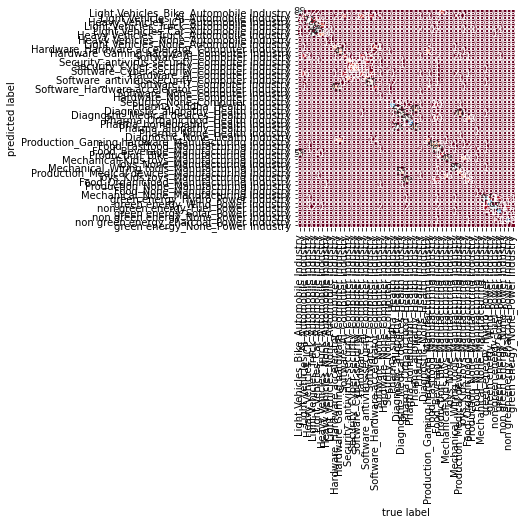


 Classification Report 

              precision    recall  f1-score   support

           0       0.59      0.75      0.66       117
           1       0.36      0.20      0.26        99
           2       0.88      0.72      0.79       100
           3       0.42      0.65      0.51       106
           4       0.80      0.84      0.82       114
           5       0.52      0.33      0.40       120
           6       0.00      0.00      0.00         1
           7       0.33      0.50      0.40         2
           8       0.38      0.49      0.43        72
           9       0.47      0.50      0.48        82
          10       0.37      0.29      0.32        73
          11       0.39      0.54      0.45        63
          12       0.43      0.36      0.39        72
          13       0.48      0.39      0.43        75
          14       0.31      0.26      0.28        70
          15       0.43      0.32      0.36        76
          16       0.52      0.82      0.63        76
 

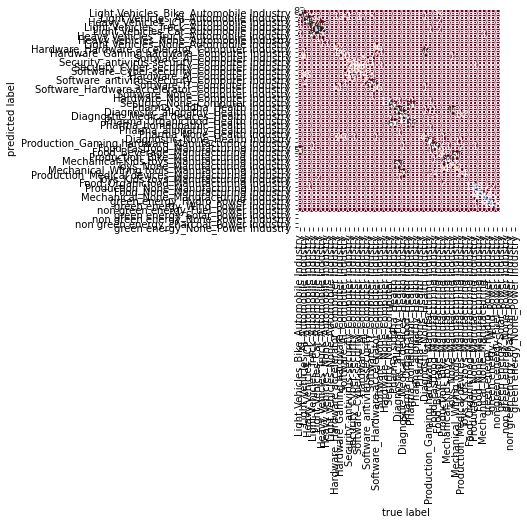


 Classification Report 

              precision    recall  f1-score   support

           0       0.60      0.71      0.65       117
           1       0.36      0.47      0.41        99
           2       0.93      0.86      0.90       100
           3       0.44      0.51      0.47       106
           4       0.85      0.93      0.89       114
           5       0.50      0.43      0.46       120
           6       0.00      0.00      0.00         1
           7       0.00      0.00      0.00         2
           8       0.43      0.44      0.44        72
           9       0.45      0.32      0.37        82
          10       0.32      0.27      0.30        73
          11       0.42      0.52      0.47        63
          12       0.44      0.39      0.41        72
          13       0.48      0.47      0.47        75
          14       0.33      0.20      0.25        70
          15       0.48      0.42      0.45        76
          16       0.77      0.89      0.83        76
 

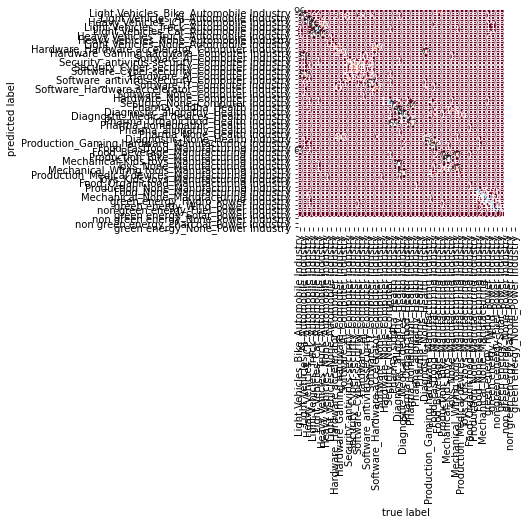


 Classification Report 

              precision    recall  f1-score   support

           0       0.59      0.82      0.69       117
           1       0.32      0.62      0.42        99
           2       0.78      0.89      0.83       100
           3       0.44      0.53      0.48       106
           4       0.86      0.89      0.88       114
           5       0.52      0.41      0.46       120
           6       0.00      0.00      0.00         1
           7       0.50      0.50      0.50         2
           8       0.46      0.46      0.46        72
           9       0.41      0.35      0.38        82
          10       0.14      0.05      0.08        73
          11       0.40      0.57      0.47        63
          12       0.46      0.38      0.41        72
          13       0.42      0.41      0.42        75
          14       0.25      0.10      0.14        70
          15       0.46      0.30      0.37        76
          16       0.76      0.80      0.78        76
 

In [ ]:
print('Baseline models using all the global metrics')
%time model_dvt(train_text_2,'combined_label',labels_all)

#Hierarchial Classification

### Making classsifiers to predict industry

In [ ]:
train_text_industry = train_text_1.drop(['Type','Product','ID','combined'], axis = 1 )

In [4]:
#create a mapping from labels to a unique integer and vice versa for labelling and prediction later
def making_labels(df , target):
  labels = df[target].unique()
  i = 0
  idx2class = {} 
  class2idx = {}
  for tp in labels:
    idx2class[i] = tp
    class2idx[tp] = i
    i += 1
  return idx2class,class2idx

In [ ]:
label_dict_industry = making_labels(train_text_industry ,'source_data')[0]

product_dict_industry = making_labels(train_text_industry ,'source_data')[1]


In [ ]:
train_text_industry['Industry_label'] = train_text_industry['source_data'].replace(product_dict_industry)

train_text_industry.drop(['source_data'], axis = 1, inplace = True)

In [ ]:
train_text_industry.head()

,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,business,called,capacity,car,...,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year,Industry_label
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


Upper Hierarchy model  to predict classes 
Train Data Dimensions :  (20258, 400)
Test Data Dimensions :  (3576, 400)

 Random Forest Classifier
CPU times: user 13.3 s, sys: 45.8 ms, total: 13.3 s
Wall time: 13.3 s

 Confusion Matrix


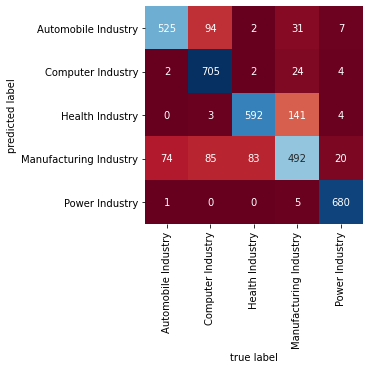


 Classification Report 

              precision    recall  f1-score   support

           0       0.87      0.80      0.83       659
           1       0.79      0.96      0.87       737
           2       0.87      0.80      0.83       740
           3       0.71      0.65      0.68       754
           4       0.95      0.99      0.97       686

    accuracy                           0.84      3576
   macro avg       0.84      0.84      0.84      3576
weighted avg       0.84      0.84      0.83      3576

Overall Accuracy :  83.72
Precision Score :  83.71
Recall Score :  83.72
--------------------------------------------------------------------------

 Naive Bayes Classifier
CPU times: user 82.3 ms, sys: 11 µs, total: 82.3 ms
Wall time: 82.5 ms

 Confusion Matrix


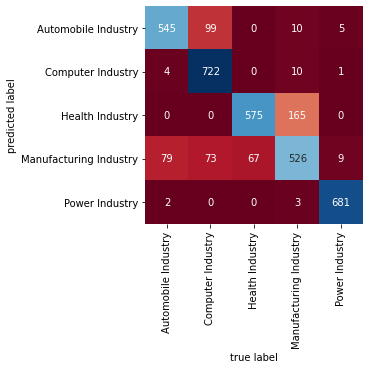


 Classification Report 

              precision    recall  f1-score   support

           0       0.87      0.83      0.85       659
           1       0.81      0.98      0.89       737
           2       0.90      0.78      0.83       740
           3       0.74      0.70      0.72       754
           4       0.98      0.99      0.99       686

    accuracy                           0.85      3576
   macro avg       0.86      0.85      0.85      3576
weighted avg       0.85      0.85      0.85      3576

Overall Accuracy :  85.26
Precision Score :  85.42
Recall Score :  85.26
--------------------------------------------------------------------------

 XG Boost Classifier
CPU times: user 1min 19s, sys: 232 ms, total: 1min 19s
Wall time: 1min 19s

 Confusion Matrix


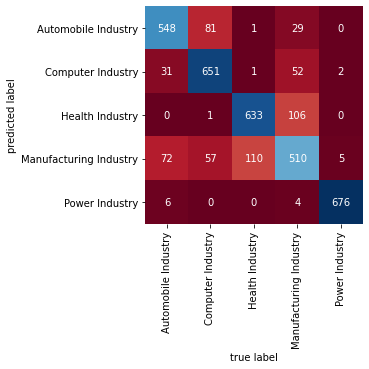


 Classification Report 

              precision    recall  f1-score   support

           0       0.83      0.83      0.83       659
           1       0.82      0.88      0.85       737
           2       0.85      0.86      0.85       740
           3       0.73      0.68      0.70       754
           4       0.99      0.99      0.99       686

    accuracy                           0.84      3576
   macro avg       0.85      0.85      0.85      3576
weighted avg       0.84      0.84      0.84      3576

Overall Accuracy :  84.4
Precision Score :  84.26
Recall Score :  84.4
--------------------------------------------------------------------------
CPU times: user 1min 34s, sys: 457 ms, total: 1min 35s
Wall time: 1min 34s


In [ ]:
print('Upper Hierarchy model  to predict classes ')
%time model_dvt(train_text_industry,'Industry_label',list(label_dict_industry.values()))

### Classifiers to predict Type

In [ ]:
train_text_type_master = train_text_1.drop(['Product','combined'], axis = 1 )

In [ ]:
train_text_type_master.head()

,ID,Type,source_data,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,business,...,traditional,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year
0,PROJ0x5377,Light Vehicles,Automobile Industry,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,...,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
1,PROJ0x24dc,Light Vehicles,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0
2,PROJ0x78e,Heavy Vehicles,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0
3,PROJ0x403b,Light Vehicles,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,PROJ0x8700,Light Vehicles,Automobile Industry,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [ ]:
train_text_type_master.source_data.value_counts()

Manufacturing Industry    4826
Computer Industry         4819
Automobile Industry       4791
Power Industry            4719
Health Industry           4679
Name: source_data, dtype: int64

In [ ]:
def get_industry_data(df, value_name):
  df_industry = df[df.source_data == value_name].copy()
  df_industry.dropna(axis = 0, inplace = True)
  df_industry.drop(['source_data'],axis =1 , inplace = True)
  label_dict = making_labels(df_industry,'Type')[1]
  labels = list(making_labels(df_industry,'Type')[0].values())
  df_industry['Type_label'] = df_industry['Type'].replace(label_dict)
  df_ID  = df_industry['ID']
  df_industry.drop(['ID','Type'], axis = 1, inplace = True)

  return df_industry,df_ID,labels



In [ ]:
df_auto = get_industry_data(train_text_type_master, 'Automobile Industry')[0]
df_comp = get_industry_data(train_text_type_master, 'Computer Industry')[0]
df_health = get_industry_data(train_text_type_master, 'Health Industry')[0]
df_manufacture = get_industry_data(train_text_type_master, 'Manufacturing Industry')[0]
df_power = get_industry_data(train_text_type_master, 'Power Industry')[0]


(0, 401)

In [ ]:
df_auto.head()

,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,business,called,capacity,car,...,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year,Type_label
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


predict types on specific industries 
Train Data Dimensions :  (4072, 400)
Test Data Dimensions :  (719, 400)

 Random Forest Classifier
CPU times: user 2.92 s, sys: 9.94 ms, total: 2.93 s
Wall time: 2.94 s

 Confusion Matrix


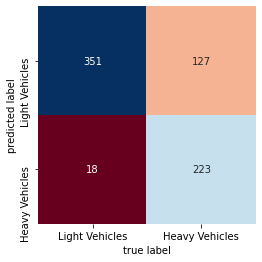


 Classification Report 

              precision    recall  f1-score   support

           0       0.95      0.73      0.83       478
           1       0.64      0.93      0.75       241

    accuracy                           0.80       719
   macro avg       0.79      0.83      0.79       719
weighted avg       0.85      0.80      0.80       719

Overall Accuracy :  79.83
Precision Score :  84.59
Recall Score :  79.83
--------------------------------------------------------------------------

 Naive Bayes Classifier
CPU times: user 14.7 ms, sys: 1.02 ms, total: 15.7 ms
Wall time: 14.5 ms

 Confusion Matrix


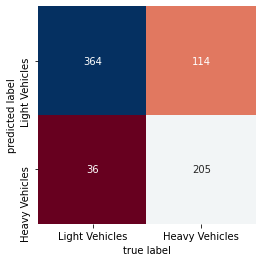


 Classification Report 

              precision    recall  f1-score   support

           0       0.91      0.76      0.83       478
           1       0.64      0.85      0.73       241

    accuracy                           0.79       719
   macro avg       0.78      0.81      0.78       719
weighted avg       0.82      0.79      0.80       719

Overall Accuracy :  79.14
Precision Score :  82.04
Recall Score :  79.14
--------------------------------------------------------------------------

 XG Boost Classifier
CPU times: user 3.37 s, sys: 4.91 ms, total: 3.37 s
Wall time: 3.37 s

 Confusion Matrix


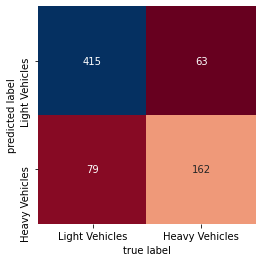


 Classification Report 

              precision    recall  f1-score   support

           0       0.84      0.87      0.85       478
           1       0.72      0.67      0.70       241

    accuracy                           0.80       719
   macro avg       0.78      0.77      0.77       719
weighted avg       0.80      0.80      0.80       719

Overall Accuracy :  80.25
Precision Score :  79.98
Recall Score :  80.25
--------------------------------------------------------------------------
CPU times: user 6.97 s, sys: 142 ms, total: 7.11 s
Wall time: 6.99 s


In [ ]:
print('predict types on specific industries ')
%time model_dvt(df_auto,'Type_label', get_industry_data(train_text_type_master, 'Automobile Industry')[2])


predict types on specific industries 
Train Data Dimensions :  (4096, 400)
Test Data Dimensions :  (723, 400)

 Random Forest Classifier
CPU times: user 4.67 s, sys: 9.84 ms, total: 4.68 s
Wall time: 4.67 s

 Confusion Matrix


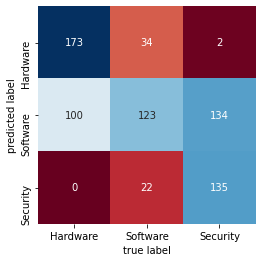


 Classification Report 

              precision    recall  f1-score   support

           0       0.63      0.83      0.72       209
           1       0.69      0.34      0.46       357
           2       0.50      0.86      0.63       157

    accuracy                           0.60       723
   macro avg       0.61      0.68      0.60       723
weighted avg       0.63      0.60      0.57       723

Overall Accuracy :  59.61
Precision Score :  63.07
Recall Score :  59.61
--------------------------------------------------------------------------

 Naive Bayes Classifier
CPU times: user 19.5 ms, sys: 0 ns, total: 19.5 ms
Wall time: 19.5 ms

 Confusion Matrix


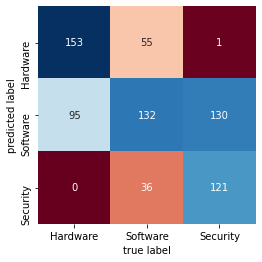


 Classification Report 

              precision    recall  f1-score   support

           0       0.62      0.73      0.67       209
           1       0.59      0.37      0.46       357
           2       0.48      0.77      0.59       157

    accuracy                           0.56       723
   macro avg       0.56      0.62      0.57       723
weighted avg       0.57      0.56      0.55       723

Overall Accuracy :  56.15
Precision Score :  57.49
Recall Score :  56.15
--------------------------------------------------------------------------

 XG Boost Classifier
CPU times: user 14.8 s, sys: 17.8 ms, total: 14.9 s
Wall time: 14.8 s

 Confusion Matrix


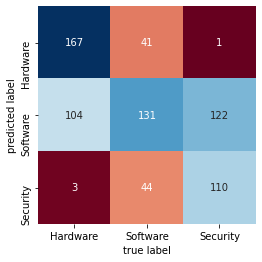


 Classification Report 

              precision    recall  f1-score   support

           0       0.61      0.80      0.69       209
           1       0.61      0.37      0.46       357
           2       0.47      0.70      0.56       157

    accuracy                           0.56       723
   macro avg       0.56      0.62      0.57       723
weighted avg       0.58      0.56      0.55       723

Overall Accuracy :  56.43
Precision Score :  57.82
Recall Score :  56.43
--------------------------------------------------------------------------
CPU times: user 22.3 s, sys: 169 ms, total: 22.5 s
Wall time: 22.3 s


In [ ]:
print('predict types on specific industries ')
%time model_dvt(df_comp,'Type_label', get_industry_data(train_text_type_master, 'Computer Industry')[2] , smote = True)

predict types on specific industries 
Train Data Dimensions :  (3977, 400)
Test Data Dimensions :  (702, 400)

 Random Forest Classifier
CPU times: user 2.99 s, sys: 9.97 ms, total: 3 s
Wall time: 3 s

 Confusion Matrix


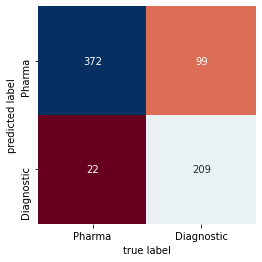


 Classification Report 

              precision    recall  f1-score   support

           0       0.94      0.79      0.86       471
           1       0.68      0.90      0.78       231

    accuracy                           0.83       702
   macro avg       0.81      0.85      0.82       702
weighted avg       0.86      0.83      0.83       702

Overall Accuracy :  82.76
Precision Score :  85.68
Recall Score :  82.76
--------------------------------------------------------------------------

 Naive Bayes Classifier
CPU times: user 14 ms, sys: 1 ms, total: 15 ms
Wall time: 14.2 ms

 Confusion Matrix


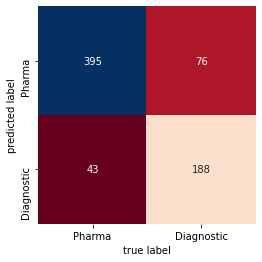


 Classification Report 

              precision    recall  f1-score   support

           0       0.90      0.84      0.87       471
           1       0.71      0.81      0.76       231

    accuracy                           0.83       702
   macro avg       0.81      0.83      0.81       702
weighted avg       0.84      0.83      0.83       702

Overall Accuracy :  83.05
Precision Score :  83.94
Recall Score :  83.05
--------------------------------------------------------------------------

 XG Boost Classifier
CPU times: user 3.36 s, sys: 2.92 ms, total: 3.36 s
Wall time: 3.36 s

 Confusion Matrix


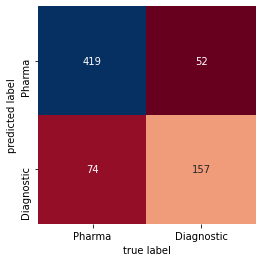


 Classification Report 

              precision    recall  f1-score   support

           0       0.85      0.89      0.87       471
           1       0.75      0.68      0.71       231

    accuracy                           0.82       702
   macro avg       0.80      0.78      0.79       702
weighted avg       0.82      0.82      0.82       702

Overall Accuracy :  82.05
Precision Score :  81.74
Recall Score :  82.05
--------------------------------------------------------------------------
CPU times: user 7.02 s, sys: 142 ms, total: 7.16 s
Wall time: 7.05 s


In [ ]:
print('predict types on specific industries ')
%time model_dvt(df_health,'Type_label', get_industry_data(train_text_type_master, 'Health Industry')[2])

predict types on specific industries 
Train Data Dimensions :  (4102, 400)
Test Data Dimensions :  (724, 400)

 Random Forest Classifier
CPU times: user 3 s, sys: 12 ms, total: 3.01 s
Wall time: 3.01 s

 Confusion Matrix


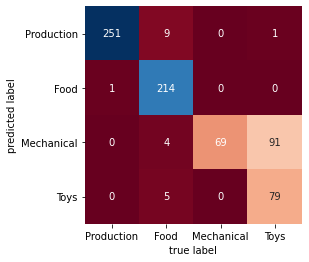


 Classification Report 

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       261
           1       0.92      1.00      0.96       215
           2       1.00      0.42      0.59       164
           3       0.46      0.94      0.62        84

    accuracy                           0.85       724
   macro avg       0.85      0.83      0.79       724
weighted avg       0.91      0.85      0.84       724

Overall Accuracy :  84.67
Precision Score :  91.31
Recall Score :  84.67
--------------------------------------------------------------------------

 Naive Bayes Classifier
CPU times: user 17.6 ms, sys: 0 ns, total: 17.6 ms
Wall time: 17.7 ms

 Confusion Matrix


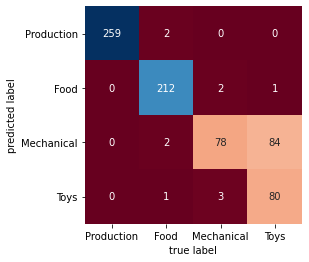


 Classification Report 

              precision    recall  f1-score   support

           0       1.00      0.99      1.00       261
           1       0.98      0.99      0.98       215
           2       0.94      0.48      0.63       164
           3       0.48      0.95      0.64        84

    accuracy                           0.87       724
   macro avg       0.85      0.85      0.81       724
weighted avg       0.92      0.87      0.87       724

Overall Accuracy :  86.88
Precision Score :  91.97
Recall Score :  86.88
--------------------------------------------------------------------------

 XG Boost Classifier
CPU times: user 12.9 s, sys: 19.8 ms, total: 13 s
Wall time: 12.9 s

 Confusion Matrix


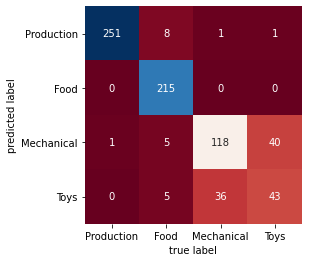


 Classification Report 

              precision    recall  f1-score   support

           0       1.00      0.96      0.98       261
           1       0.92      1.00      0.96       215
           2       0.76      0.72      0.74       164
           3       0.51      0.51      0.51        84

    accuracy                           0.87       724
   macro avg       0.80      0.80      0.80       724
weighted avg       0.86      0.87      0.86       724

Overall Accuracy :  86.6
Precision Score :  86.49
Recall Score :  86.6
--------------------------------------------------------------------------
CPU times: user 16.8 s, sys: 186 ms, total: 17 s
Wall time: 16.8 s


In [ ]:
print('predict types on specific industries ')
%time model_dvt(df_manufacture,'Type_label', get_industry_data(train_text_type_master, 'Manufacturing Industry')[2])

predict types on specific industries 
Train Data Dimensions :  (4011, 400)
Test Data Dimensions :  (708, 400)

 Random Forest Classifier
CPU times: user 3.19 s, sys: 7.99 ms, total: 3.19 s
Wall time: 3.2 s

 Confusion Matrix


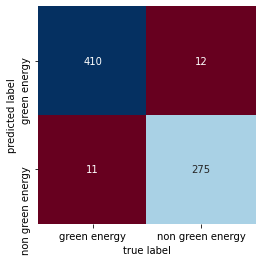


 Classification Report 

              precision    recall  f1-score   support

           0       0.97      0.97      0.97       422
           1       0.96      0.96      0.96       286

    accuracy                           0.97       708
   macro avg       0.97      0.97      0.97       708
weighted avg       0.97      0.97      0.97       708

Overall Accuracy :  96.75
Precision Score :  96.75
Recall Score :  96.75
--------------------------------------------------------------------------

 Naive Bayes Classifier
CPU times: user 14.8 ms, sys: 7 µs, total: 14.9 ms
Wall time: 14 ms

 Confusion Matrix


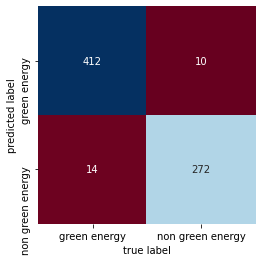


 Classification Report 

              precision    recall  f1-score   support

           0       0.97      0.98      0.97       422
           1       0.96      0.95      0.96       286

    accuracy                           0.97       708
   macro avg       0.97      0.96      0.96       708
weighted avg       0.97      0.97      0.97       708

Overall Accuracy :  96.61
Precision Score :  96.61
Recall Score :  96.61
--------------------------------------------------------------------------

 XG Boost Classifier
CPU times: user 3.27 s, sys: 8.03 ms, total: 3.28 s
Wall time: 3.28 s

 Confusion Matrix


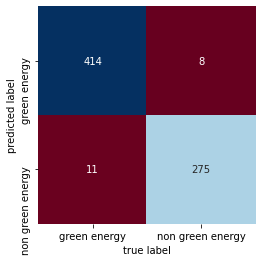


 Classification Report 

              precision    recall  f1-score   support

           0       0.97      0.98      0.98       422
           1       0.97      0.96      0.97       286

    accuracy                           0.97       708
   macro avg       0.97      0.97      0.97       708
weighted avg       0.97      0.97      0.97       708

Overall Accuracy :  97.32
Precision Score :  97.32
Recall Score :  97.32
--------------------------------------------------------------------------
CPU times: user 7.13 s, sys: 153 ms, total: 7.28 s
Wall time: 7.18 s


In [ ]:
print('predict types on specific industries ')
%time model_dvt(df_power,'Type_label', get_industry_data(train_text_type_master, 'Power Industry')[2])

### Classifiers to predict Product

In [ ]:
train_text_product_master = train_text_1.drop(['combined'], axis = 1 )


In [ ]:
train_text_product_master.head()
train_text_product_master.drop(['ID','Type','source_data'], axis = 1 , inplace = True)

In [ ]:
train_text_product_master['Product'].value_counts()

AI                      1793
allopathy               1585
Truck                   1553
Bike                    1412
Medical devices         1312
Organicfood             1202
Kids toys               1074
Gaming hardware         1045
Solar                   1004
antivirus-security       966
Cyber-security           956
charcoal                 945
Fuel                     944
Hydro                    940
Hardware accelerator     925
Wind                     872
siddha                   819
JCP                      793
homeopathic              782
Car                      756
Fastfood                 566
Wiring tools             535
Beverage                 510
IT                       473
None                      72
Name: Product, dtype: int64

In [ ]:
label_dict = making_labels(train_text_product_master ,'Product')[0]

product_dict = making_labels(train_text_product_master ,'Product')[1]


In [ ]:
train_text_product_master['Product_label'] = train_text_product_master['Product'].replace(product_dict)

train_text_product_master.drop(['Product'], axis = 1, inplace = True)


In [ ]:
train_text_product_master.head()

,access,according,activity,address,air,allopathic,allopathy,also,alternative,although,amd,america,american,among,amount,announced,another,application,approach,area,around,attack,automobile,available,based,battery,became,become,began,bike,billion,board,body,building,built,bus,business,called,capacity,car,...,training,transmission,transport,treating,treatment,truck,turbine,two,type,typically,uk,unit,united,united state,university,usage,use,used,user,using,usually,value,various,vehicle,venture,venture called,video,water,wave,way,well,wind,within,without,word,work,world,would,year,Product_label
0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1
2,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,1,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,1,0,2
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,...,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,...,0,2,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1


Predict Products using all features 
Train Data Dimensions :  (20258, 400)
Test Data Dimensions :  (3576, 400)

 Random Forest Classifier
CPU times: user 14.1 s, sys: 25.6 ms, total: 14.2 s
Wall time: 14.2 s

 Confusion Matrix


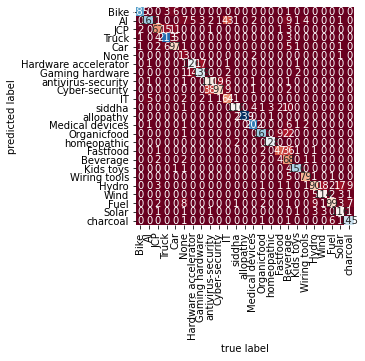


 Classification Report 

              precision    recall  f1-score   support

           0       0.98      0.95      0.96       195
           1       0.95      0.67      0.79       242
           2       0.81      0.67      0.73       100
           3       0.90      0.94      0.92       226
           4       0.81      0.85      0.83       114
           5       0.31      0.81      0.45        16
           6       0.87      0.86      0.86       147
           7       0.86      0.88      0.87       158
           8       0.72      0.79      0.75       139
           9       0.82      0.66      0.73       147
          10       0.51      0.84      0.64        76
          11       0.94      0.85      0.89       137
          12       1.00      0.99      0.99       242
          13       0.95      0.95      0.95       213
          14       0.95      0.84      0.89       195
          15       0.97      0.98      0.98       130
          16       0.73      0.53      0.62        88
 

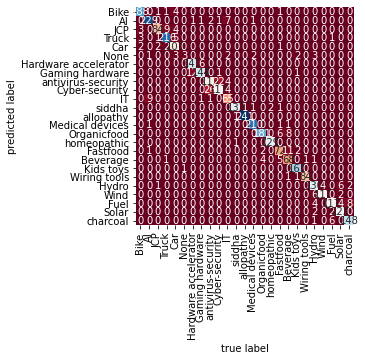


 Classification Report 

              precision    recall  f1-score   support

           0       0.96      0.96      0.96       195
           1       0.95      0.95      0.95       242
           2       0.94      0.84      0.89       100
           3       0.94      0.96      0.95       226
           4       0.87      0.94      0.90       114
           5       0.75      0.19      0.30        16
           6       0.92      0.96      0.94       147
           7       0.95      0.91      0.93       158
           8       0.80      0.81      0.80       139
           9       0.83      0.80      0.81       147
          10       0.79      0.86      0.82        76
          11       0.99      0.96      0.97       137
          12       1.00      1.00      1.00       242
          13       0.98      0.99      0.98       213
          14       0.97      0.93      0.95       195
          15       0.98      0.99      0.99       130
          16       0.83      0.82      0.82        88
 

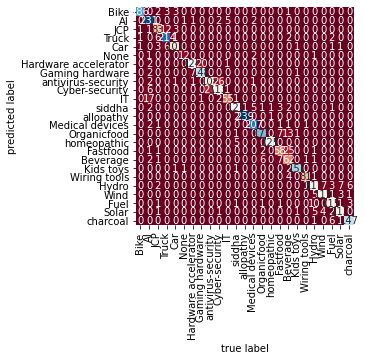


 Classification Report 

              precision    recall  f1-score   support

           0       0.98      0.95      0.97       195
           1       0.86      0.95      0.90       242
           2       0.82      0.83      0.83       100
           3       0.91      0.95      0.93       226
           4       0.92      0.89      0.90       114
           5       0.86      0.75      0.80        16
           6       0.93      0.84      0.89       147
           7       0.88      0.94      0.91       158
           8       0.80      0.78      0.79       139
           9       0.78      0.77      0.78       147
          10       0.89      0.72      0.80        76
          11       0.92      0.88      0.90       137
          12       1.00      0.99      0.99       242
          13       0.95      0.97      0.96       213
          14       0.95      0.89      0.92       195
          15       0.98      0.96      0.97       130
          16       0.75      0.66      0.70        88
 

In [ ]:
print('Predict Products using all features ')
%time model_dvt(train_text_product_master,'Product_label',list(label_dict.values()))

In [ ]:
--------------------------------------

#Preparing Test Set and Predictions 

In [ ]:
######################################### Processing Test dataset 

In [ ]:
import os
import glob
import re

# use glob to get all the csv files 
# in the folder
path = 'dataset/test/product_info/'
txt_files = glob.glob(os.path.join(path, "*.txt"))

column_names = ["Product_ID", "Product_Info"]

product_descriptions_test = pd.DataFrame(columns = column_names)

# loop over the list of csv files
for a in txt_files:
    regex = r"([a-zA-Z0-9]+).txt"
    matches = re.findall(regex, a, re.MULTILINE)

    with open(a, 'r', encoding="utf-8") as file:
      data = file.read().replace('\n', '')
      product_descriptions_test = product_descriptions_test.append({'Product_ID': matches[0], 'Product_Info': data}, ignore_index=True)
     # print('File Name:', a.split("\\")[-1])
    # print the location and filename
    # print('Location:', f)p